### Ensure using GPU in Google Colab or some libraries will not work. They are built for GPU usage

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

In [ ]:
!pip install pyyaml==5.1

In [ ]:
!pip install torch==1.7.1+cu101 torchvision==0.8.2+cu101 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

In [ ]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

In [ ]:
import torch
print(torch.__version__)

In [ ]:
import numpy as np
import os, json, cv2, random, io
from PIL import Image
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from google.colab.patches import cv2_imshow

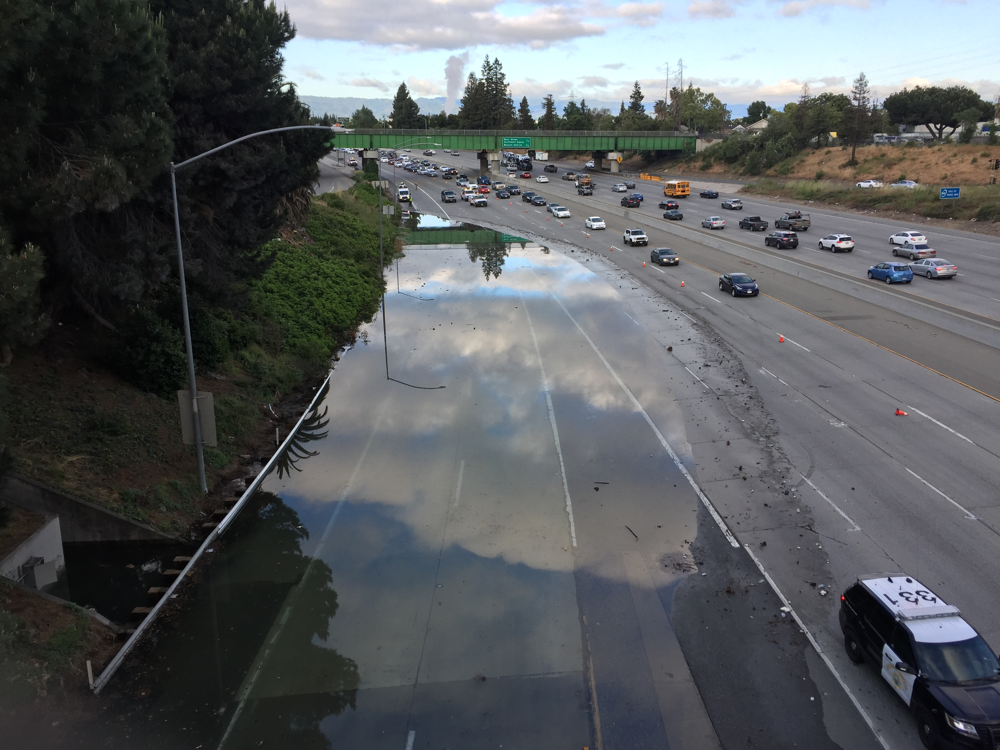

In [ ]:
im = cv2.imread("/gdrive/MyDrive/Colab Notebooks/FloodFinder/data/train/sjflooding.jpg")
cv2_imshow(im)

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")

predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
meta = MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

# conform sear, water, river to water category
for seg in segments_info:
        if seg['category_id'] in ( 20, 24):  # river & sea 
            seg['category_id'] = 34  # water

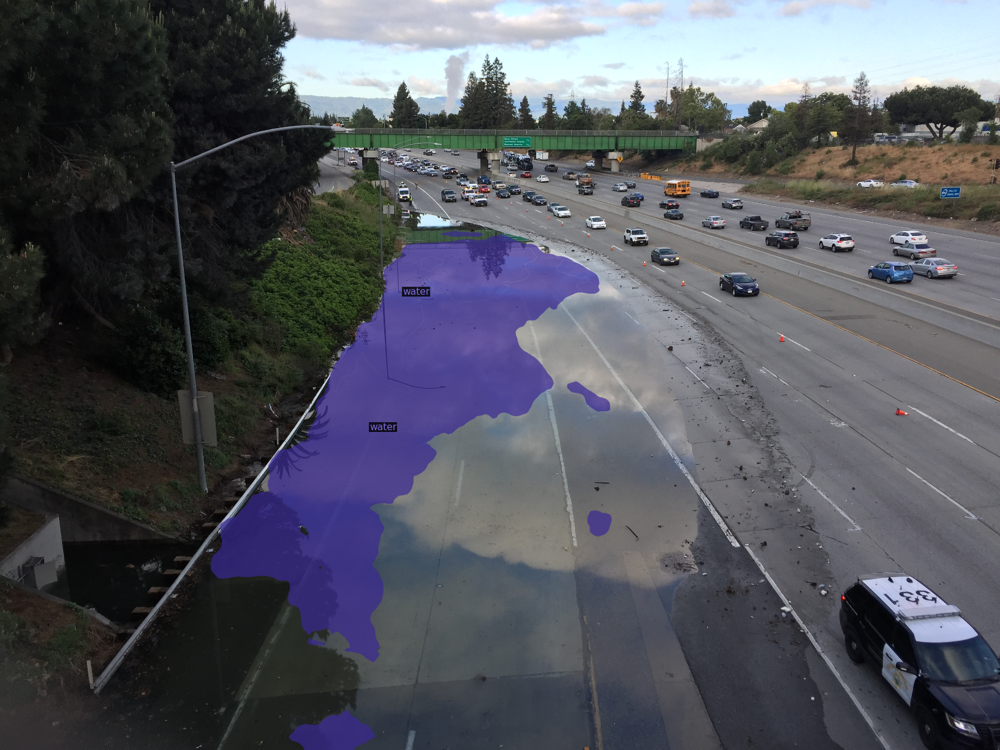

True

In [ ]:
water_category = 34
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5)

# Visualize only water segmentations
water_segment = []
for s in segments_info:
    if s['category_id'] == water_category:
        water_segment.append(s)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), water_segment)
img_out = out.get_image()[:, :, ::-1]

# Show the segmented image
cv2_imshow(img_out)

# Save the segmented image to PNG file.
cv2.imwrite("/gdrive/MyDrive/Colab Notebooks/FloodFinder/data/train/sjflooding-scanned.png", img_out)

In [ ]:
def _convert_category_id( segment_info):
    # return segment_info
    _thing_contiguous_id_to_dataset_id = {
        v: k for k, v in meta.thing_dataset_id_to_contiguous_id.items()
    }
    _stuff_contiguous_id_to_dataset_id = {
        v: k for k, v in meta.stuff_dataset_id_to_contiguous_id.items()
    }

    isthing = segment_info.pop("isthing", None)
    if isthing is None:
        # the model produces panoptic category id directly. No more conversion needed
        return segment_info
    if isthing is True:
        segment_info["category_id"] = _thing_contiguous_id_to_dataset_id[
            segment_info["category_id"]
        ]
    else:
        segment_info["category_id"] = _stuff_contiguous_id_to_dataset_id[
            segment_info["category_id"]
        ]
    return segment_info

def _process_segment_info( j):
    json_data = None
    with open("/gdrive/MyDrive/Colab Notebooks/FloodFinder/coco_categories.json", "r") as f:
        json_data = json.load(f)

    water_categories = filter(lambda x: x["supercategory"] == "water", json_data["categories"])
    water_categories = list(map(lambda x: x["id"], list(water_categories)))

    print(water_categories)

    confidence_threshold = 0.85
    water_area = 0
    for i in j["segments_info"]:
        if i["category_id"] in water_categories:  # and i["score"] >= confidence_threshold:
            water_area += i["area"]

    j["total_area"] = j["height"] * j["width"]
    j["water_area"] = water_area
    j["water_area_percentage"] = j["water_area"] * 100 / j["total_area"]

    return j



In [ ]:
panoptic_img = panoptic_seg.cpu().numpy()

pred = {"image_id": "img_fnm",
        "id": 0,
        "height": panoptic_img.shape[0],
        "width": panoptic_img.shape[1],
        "file_name": "file_name_png",
        "segments_info": [_convert_category_id(x) for x in segments_info]
        }

prediction = _process_segment_info(pred)
print(prediction)

[148, 155, 178]
Total Area : 7990272
Total(all) objects area: 705365.0
Total water logged area: 705365.0
Total water area coverage: 100.0%
{'image_id': 'img_fnm', 'id': 0, 'height': 2448, 'width': 3264, 'file_name': 'file_name_png', 'segments_info': [{'id': 1, 'score': 0.9820539951324463, 'category_id': 3, 'instance_id': 0}, {'id': 2, 'score': 0.9747315645217896, 'category_id': 3, 'instance_id': 1}, {'id': 3, 'score': 0.9729961156845093, 'category_id': 3, 'instance_id': 2}, {'id': 4, 'score': 0.970072865486145, 'category_id': 3, 'instance_id': 3}, {'id': 5, 'score': 0.9692006707191467, 'category_id': 3, 'instance_id': 4}, {'id': 6, 'score': 0.941259503364563, 'category_id': 3, 'instance_id': 5}, {'id': 7, 'score': 0.9406012296676636, 'category_id': 3, 'instance_id': 6}, {'id': 8, 'score': 0.9282869696617126, 'category_id': 3, 'instance_id': 7}, {'id': 9, 'score': 0.9087919592857361, 'category_id': 3, 'instance_id': 8}, {'id': 10, 'score': 0.9076858162879944, 'category_id': 3, 'instance

### The prediction and location of the images are stored in the database which is later used for display on the Map Web UI.
### water_area_percentage field in the prediction JSON can be used for threshold for severity and color coding the alerts.